# Harry Potter — Network Analysis, Information Spread & Influence Maximisation

This notebook covers the full pipeline applied to **Harry Potter and the Philosopher's Stone (Book 1)** and **Harry Potter and the Deathly Hallows (Book 7)**:

1. **Character Scraping** — extract character lists from the web
2. **Network Construction** — use NLP (spaCy NER) + a sliding window to build co-occurrence graphs
3. **Network Visualisation** — static (matplotlib) and interactive (pyvis) plots
4. **Centrality & Community Analysis** — degree / closeness / betweenness centrality + Louvain communities
5. **Information Spread** — Independent Cascade (IC) simulation
6. **Influence Maximisation** — compare seeding strategies and brute-force optimal seed sets


---
## 0. Installation & Imports

In [2]:
!pip install pyvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 79.0 MB/s eta 0:00:00


In [3]:
import os, re, random
from itertools import product

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tqdm

import spacy
from spacy import displacy

import networkx as nx
from pyvis.network import Network

from bs4 import BeautifulSoup
import requests

---
## 1. Character Scraping

We scrape character lists from fan-study websites and save them as CSV files for use in the network-building step.

### 1.1 Book 1 — Harry Potter and the Philosopher's Stone

In [4]:
#Make request to website
r = requests.get("https://www.shmoop.com/study-guides/literature/harry-potter-sorcerers-stone/characters")

#Convert text to HTML and find character names via <h3> tags
soup = BeautifulSoup(r.text, "html.parser")
table = soup.find_all("h3")

#Build list of characters
data = []
for i in table:
    data.append({"character": i.text})

character_df = pd.DataFrame(data)

#Drop footer/irrelevant rows
character_df.drop([0,1,2,3,4,5,6,7, 8, 13], axis=0, inplace=True)

#Standardise first-name entries (scraped names may include role descriptions)
name_map = {
    9:'Harry', 10:'Ron', 11:'Hermione', 12:'Dumbledore', 14:'Hagrid',
    15:'McGonagall', 16:'Snape', 17:'Quirrell', 18:'Malfoy', 19:'Vernon',
    20:'Petunia', 21:'Dudley', 23:'Crabbe', 25:'Filch', 26:'Seamus',
    27:'Nicolas Flamel', 29:'Flitwick', 35:'Neville', 40:'Ollivander',
    44:'James', 47:'Dean', 49:'Charlie', 50:'Fred', 51:'Ginny',
    52:'Percy'
}
for idx, name in name_map.items():
    character_df.loc[idx] = [name]

for name in ['Goyle', 'Lilly', 'George']:
    character_df.loc[len(character_df)+100] = [name]

character_df.to_csv('charactersH.csv', index=False)
print(f'Book 1 characters saved: {len(character_df)} entries')
character_df

Book 1 characters saved: 28 entries


,character
9,Harry
10,Ron
11,Hermione
12,Dumbledore
14,Hagrid
15,McGonagall
16,Snape
17,Quirrell
18,Malfoy
19,Vernon


### 1.2 Book 7 — Harry Potter and the Deathly Hallows

In [5]:
# These are the main characters from Harry Potter and the Deathly Hallows.

book7_characters = [
    "Harry Potter", "Hermione Granger", "Ron Weasley", "Albus Dumbledore",
    "Voldemort", "Severus Snape", "Draco Malfoy", "Neville Longbottom",
    "Luna Lovegood", "Ginny Weasley", "Fred Weasley", "George Weasley",
    "Arthur Weasley", "Molly Weasley", "Percy Weasley", "Charlie Weasley",
    "Bill Weasley", "Fleur Delacour", "Bellatrix Lestrange", "Lucius Malfoy",
    "Narcissa Malfoy", "Rubeus Hagrid", "Minerva McGonagall", "Aberforth Dumbledore",
    "Remus Lupin", "Nymphadora Tonks", "Alastor Moody", "Dobby",
    "Kreacher", "Peter Pettigrew", "Griphook", "Ollivander",
    "Mundungus Fletcher", "Dean Thomas", "Seamus Finnigan", "Colin Creevey",
    "Viktor Krum", "Fenrir Greyback", "Pius Thicknesse", "Rufus Scrimgeour",
    "Kingsley Shacklebolt", "Vincent Crabbe", "Gregory Goyle", "Blaise Zabini",
    "Pansy Parkinson", "Phineas Black", "Regulus Black", "Amycus Carrow",
    "Alecto Carrow", "Xenophilius Lovegood", "Bathilda Bagshot", "Rita Skeeter",
    "James Potter", "Lily Potter", "Sirius Black"
]

character_df7 = pd.DataFrame({"full_name": book7_characters})
character_df7 = character_df7.drop_duplicates().reset_index(drop=True)

character_df7.to_csv('charactersH7.csv', index=False)
print(f'Book 7 characters saved: {len(character_df7)} entries')
character_df7.head(10)

Book 7 characters saved: 55 entries


,full_name
0,Harry Potter
1,Hermione Granger
2,Ron Weasley
3,Albus Dumbledore
4,Voldemort
5,Severus Snape
6,Draco Malfoy
7,Neville Longbottom
8,Luna Lovegood
9,Ginny Weasley


---
## 2. NLP & Network Construction

We use spaCy's Named Entity Recognition (NER) to detect character mentions in each sentence, then apply a **sliding window** of size 5 to link characters that appear near each other. Edge weights reflect co-occurrence frequency.

In [6]:
#Load spaCy model
NER = spacy.load('en_core_web_sm')
NER.max_length = 2_000_000   # increase limit for longer books

# On Google Colab, files are uploaded to /content/
book1_path = '/content/Book1.txt'
book7_path = '/content/Book7.txt'

all_books = [book1_path, book7_path]
print('Books found:', all_books)

Books found: ['/content/Book1.txt', '/content/Book7.txt']


### 2.1 Shared Helper Functions

In [7]:
def load_book_doc(book_path):
    """Read a book file and process it with spaCy NER."""
    text = open(book_path, encoding='ISO-8859-1').read()
    return NER(text)


def build_sent_entity_df(book_doc):
    """Return a DataFrame of (sentence, entity_list) pairs."""
    rows = []
    for sent in book_doc.sents:
        rows.append({'sentence': sent,
                     'entities': [ent.text for ent in sent.ents]})
    return pd.DataFrame(rows)


def build_relationship_df(sent_entity_df_filtered, window_size=5):
    """Apply a sliding window to co-occurring character entities and
    return a weighted edge list DataFrame."""
    relationships = []
    last_idx = sent_entity_df_filtered.index[-1]
    for i in range(last_idx):
        end_i = min(i + window_size, last_idx)
        char_list = sum(sent_entity_df_filtered.loc[i:end_i, 'character_entities'].tolist(), [])
        char_unique = [char_list[j] for j in range(len(char_list))
                       if j == 0 or char_list[j] != char_list[j-1]]
        if len(char_unique) > 1:
            for idx, a in enumerate(char_unique[:-1]):
                relationships.append({'source': a, 'target': char_unique[idx+1]})
    rel_df = pd.DataFrame(relationships)
    rel_df = pd.DataFrame(np.sort(rel_df.values, axis=1), columns=rel_df.columns)
    rel_df['value'] = 1
    rel_df = rel_df.groupby(['source', 'target'], sort=False, as_index=False).sum()
    return rel_df


def build_graph(rel_df):
    """Build a weighted undirected NetworkX graph from a relationship DataFrame."""
    return nx.from_pandas_edgelist(
        rel_df, source='source', target='target',
        edge_attr='value', create_using=nx.Graph()
    )

---
## 3. Book 1 — Philosopher's Stone

Full pipeline: entity filtering → relationship extraction → network construction → visualisation → centrality → community detection → information spread → influence maximisation.

### 3.1 Load Book & Filter Character Entities

In [8]:
#Load character list
char_df1 = pd.read_csv('charactersH.csv')
char_df1.head()

,character
0,Harry
1,Ron
2,Hermione
3,Dumbledore
4,Hagrid


In [10]:
#Process book with NER
book1_doc = load_book_doc(all_books[0])

#Preview NER output on the first 2 000 tokens
displacy.render(book1_doc[0:2000], style='ent', jupyter=True)

In [11]:
#Filter NER entities to known characters (match on first name)
def filter_entity_book1(ent_list, character_df):
    return [ent for ent in ent_list
            if ent in list(character_df.character)
            or ent.split()[0] in list(character_df.character)]

sent_df1 = build_sent_entity_df(book1_doc)
sent_df1['character_entities'] = sent_df1['entities'].apply(
    lambda x: filter_entity_book1(x, char_df1))

#Keep only sentences that mention at least one character
sent_df1_filtered = sent_df1[sent_df1['character_entities'].map(len) > 0].copy()

#Reduce to first name for consistency
sent_df1_filtered['character_entities'] = sent_df1_filtered['character_entities'].apply(
    lambda x: [item.split()[0] for item in x])

sent_df1_filtered.head()

,sentence,entities,character_entities
5,"(The, Dursley, s, had, a, small, son, \n, call...",[Dudley],[Dudley]
10,"(Harry, Potter, and, the, Philosophers, Stone,...","[Harry Potter, the Philosophers Stone - J.K. R...",[Harry]
13,"(This, boy, was, another, good, reason, for, k...",[Dudley],[Dudley]
15,"(Mr., Dursley, hummed, as, he, picked, out, \n...","[Dursley, Dursley, Dudley]",[Dudley]
17,"(At, half, past, eight, ,, Mr., Dursley, picke...","[half past eight, Dursley, Dursley, Dudley, Du...","[Dudley, Dudley]"


### 3.2 Build Relationship Graph

In [12]:
rel_df1 = build_relationship_df(sent_df1_filtered)
G1 = build_graph(rel_df1)

weighted_degrees1 = dict(nx.degree(G1, weight='value'))
print(f"Nodes: {G1.number_of_nodes()}, Edges: {G1.number_of_edges()}")
rel_df1.head()

Nodes: 27, Edges: 140


,source,target,value
0,Dudley,Harry,613
1,Harry,Petunia,7
2,Dumbledore,Harry,415
3,Dumbledore,McGonagall,135
4,Harry,McGonagall,320


### 3.3 Visualisation

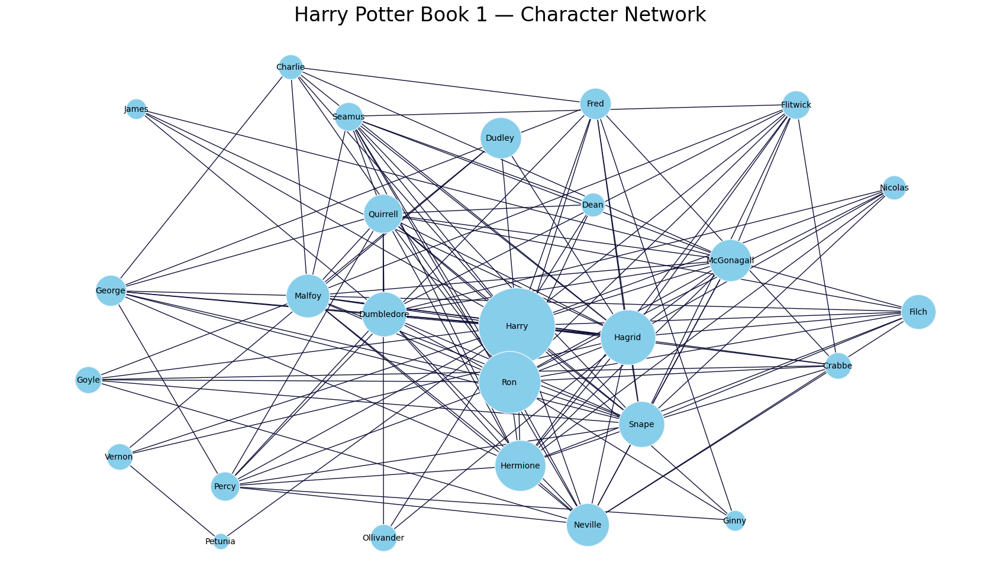

In [13]:
#Static matplotlib plot
pos1 = nx.spring_layout(G1, weight='value', iterations=20, k=4, seed=42)

plt.figure(figsize=(17, 10))
plt.axis('off')
plt.title('Harry Potter Book 1 — Character Network', fontsize=24)

for node in G1.nodes():
    size = 100 * weighted_degrees1[node] ** 0.5
    ns = nx.draw_networkx_nodes(G1, pos1, nodelist=[node],
                                node_size=size, node_color='skyblue')
    ns.set_edgecolor('#f2f6fa')

nx.draw_networkx_labels(G1, pos1,
    {n: n.replace('-', '\n') for n in G1.nodes()}, font_size=10)

for e in G1.edges(data=True):
    nx.draw_networkx_edges(G1, pos1, [e], edge_color='#0f0f37')

plt.tight_layout()
plt.show()

In [14]:
from IPython.display import display, HTML

net1 = Network(width='1000px', height='700px',
               bgcolor='#222222', font_color='white', cdn_resources='in_line')
nx.set_node_attributes(G1, dict(G1.degree), 'size')
net1.from_nx(G1)
net1.repulsion()
net1.save_graph('Harry_Potter_Book1.html')

with open('Harry_Potter_Book1.html', 'r') as f:
    html = f.read()

display(HTML(html))

### 3.4 Centrality Analysis

In [15]:
deg_cent1   = nx.degree_centrality(G1)
clo_cent1   = nx.closeness_centrality(G1)
bet_cent1   = nx.betweenness_centrality(G1)

print('Highest Degree Centrality:     ', max(zip(deg_cent1.values(), deg_cent1.keys())))
print('Highest Closeness Centrality:  ', max(zip(clo_cent1.values(), clo_cent1.keys())))
print('Highest Betweenness Centrality:', max(zip(bet_cent1.values(), bet_cent1.keys())))

print(f'Average Shortest Path Length:  {nx.average_shortest_path_length(G1):.4f}')

Highest Degree Centrality:      (1.0, 'Harry')
Highest Closeness Centrality:   (1.0, 'Harry')
Highest Betweenness Centrality: (0.28187190587190586, 'Harry')
Average Shortest Path Length:  1.6011


### 3.5 Community Detection (Louvain)

In [16]:
!pip uninstall -y community
!pip install python-louvain

Found existing installation: community 1.0.0b1
Uninstalling community-1.0.0b1:
  Successfully uninstalled community-1.0.0b1


In [18]:
from community import community_louvain
partition1 = community_louvain.best_partition(G1)

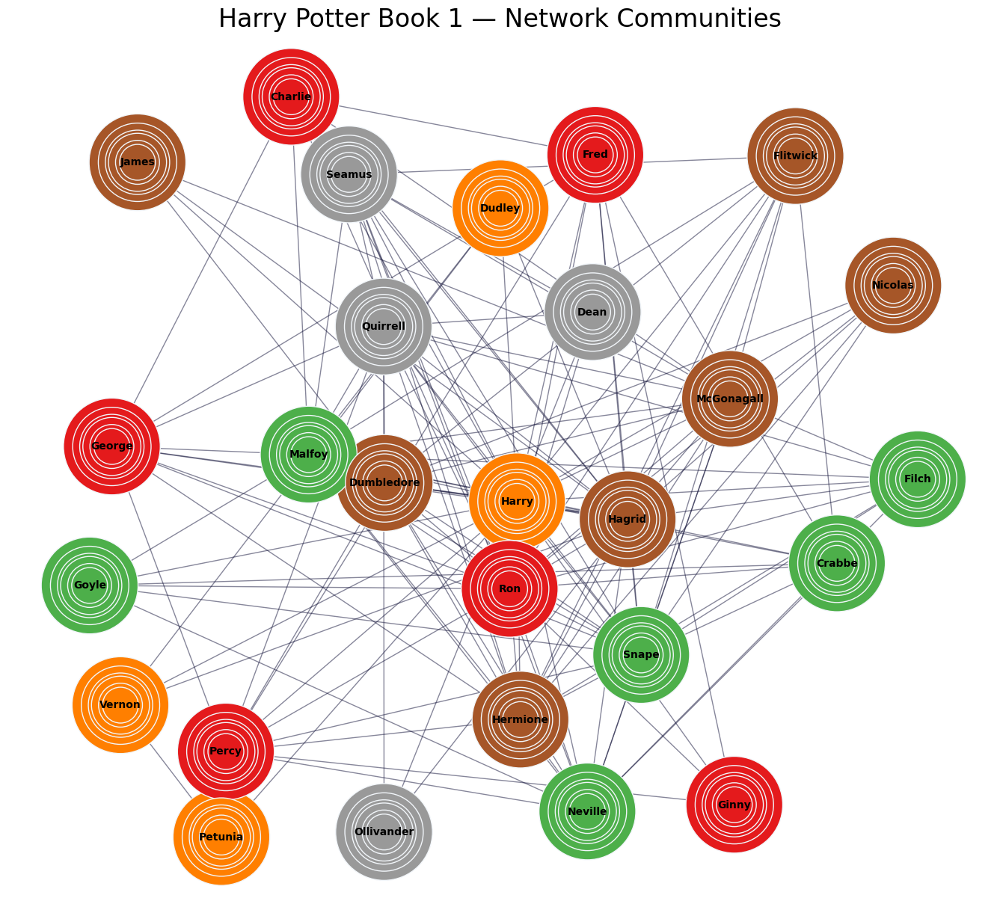

In [20]:
partition1 = community_louvain.best_partition(G1)

#Static community plot
pos1_comm = nx.spring_layout(G1, weight='value', iterations=20, k=4, seed=42)
plt.figure(figsize=(17, 15))

for node in G1.nodes():
    size = 100 * weighted_degrees1[node] ** 0.5
    ns = nx.draw_networkx_nodes(G1, pos1_comm, node_size=size,
                                node_color=list(partition1.values()),
                                cmap=plt.cm.Set1)
    ns.set_edgecolor('#f2f6fa')

for e in G1.edges(data=True):
    nx.draw_networkx_edges(G1, pos1_comm, [e], edge_color='#0f0f37', alpha=0.5)

nx.draw_networkx_labels(G1, pos1_comm,
    {n: n.replace('-', '\n') for n in G1.nodes()},
    font_size=10, font_weight='bold')

plt.axis('off')
plt.title('Harry Potter Book 1 — Network Communities', fontsize=24)
plt.show()

#Interactive community network
nx.set_node_attributes(G1, partition1, 'group')
com_net1 = Network(width='1000px', height='700px',
                   bgcolor='#222222', font_color='white', cdn_resources='in_line')
com_net1.from_nx(G1)
com_net1.repulsion()
com_net1.save_graph('harry_potter_book1_communities.html')

with open('harry_potter_book1_communities.html', 'r') as f:
    html = f.read()

display(HTML(html))

### 3.6 Information Spread — Independent Cascade Model

In [21]:
def independent_cascade(G, t, infection_times):
    """Run one time-step (t → t+1) of the Independent Cascade model.
    Infection probability is proportional to edge weight."""
    max_weight = max(e[2]['value'] for e in G.edges(data=True))
    current_infectious = [n for n in infection_times if infection_times[n] == t]
    for n in current_infectious:
        for v in G.neighbors(n):
            if v not in infection_times:
                if G[n][v]['value'] >= np.random.random() * max_weight:
                    infection_times[v] = t + 1
    return infection_times


def plot_cascade(G, pos, weighted_degrees, infection_times, t, title_prefix='Network'):
    """Visualise the network at time step t of an IC simulation."""
    current_infectious = [n for n in infection_times if infection_times[n] == t]
    plt.figure(figsize=(17, 10))
    plt.axis('off')
    plt.title(f'{title_prefix}, t={t}', fontsize=24)
    for node in G.nodes():
        size = 100 * weighted_degrees[node] ** 0.5
        if node in current_infectious:
            color = '#feba02'   # currently spreading
        elif infection_times.get(node, 9_999_999) < t:
            color = '#f2f6fa'   # already recovered / past
        else:
            color = '#009fe3'   # susceptible
        ns = nx.draw_networkx_nodes(G, pos, nodelist=[node],
                                    node_size=size, node_color=color)
        ns.set_edgecolor('#f2f6fa')
    nx.draw_networkx_labels(G, pos,
        {n: n.replace('-', '\n') for n in G.nodes()}, font_size=10)
    for e in G.edges(data=True):
        nx.draw_networkx_edges(G, pos, [e], edge_color='#707070')
    plt.show()

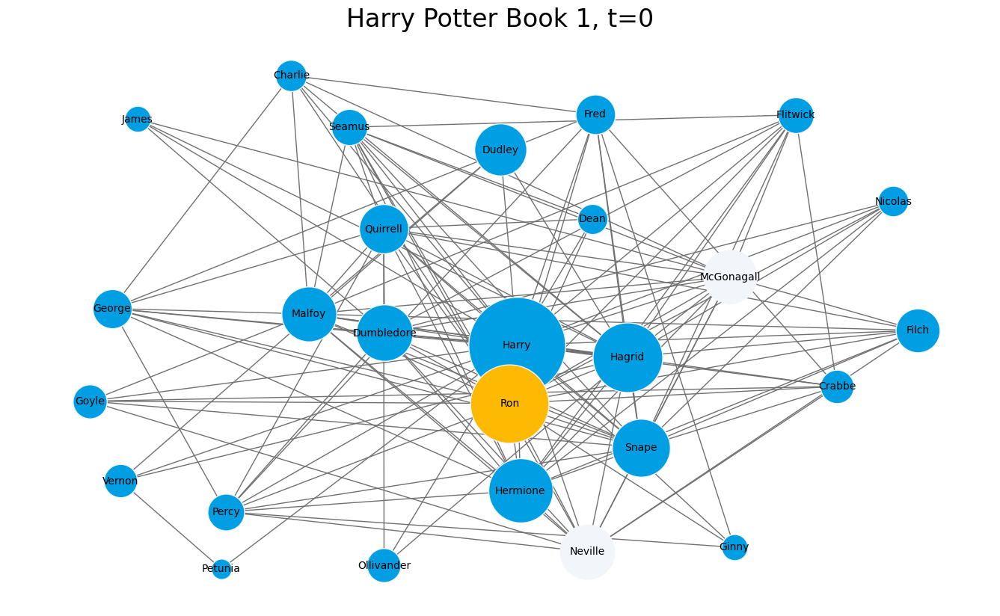

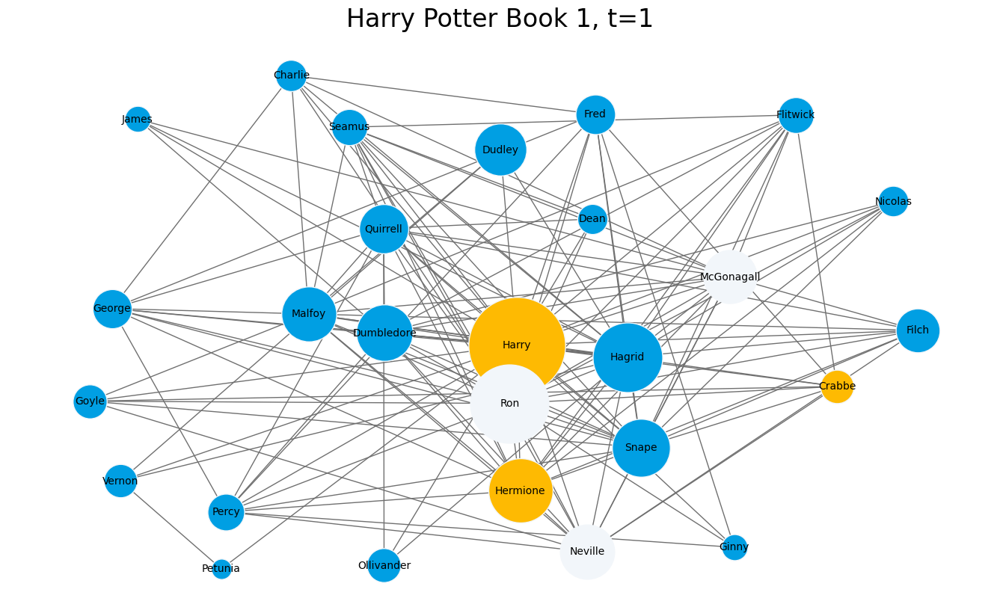

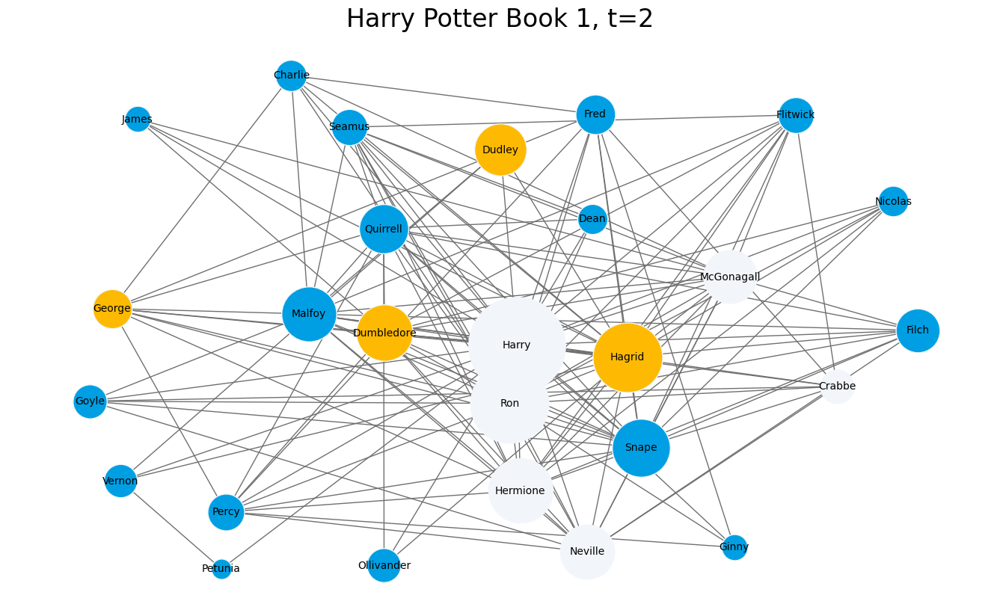

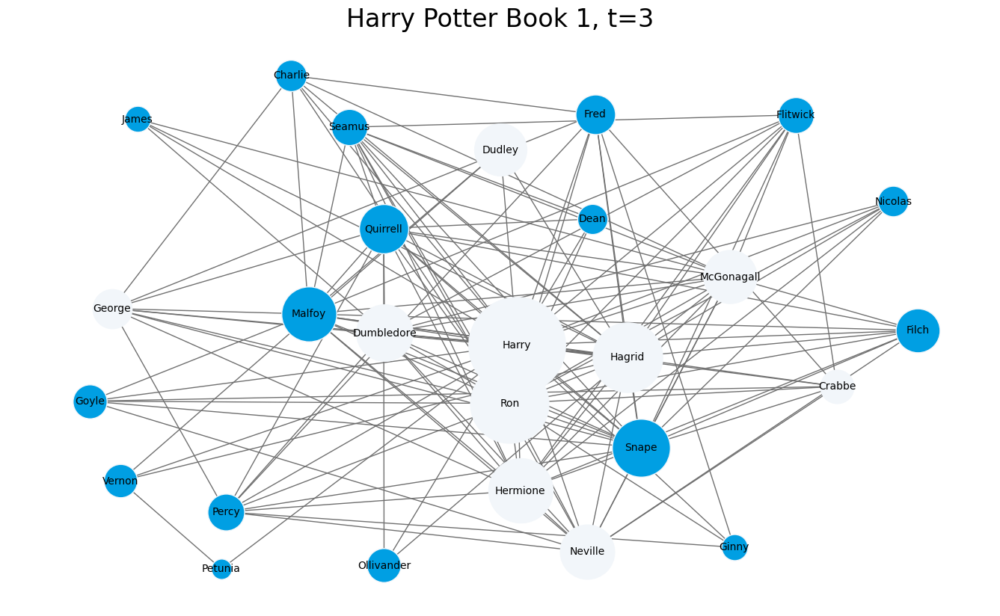

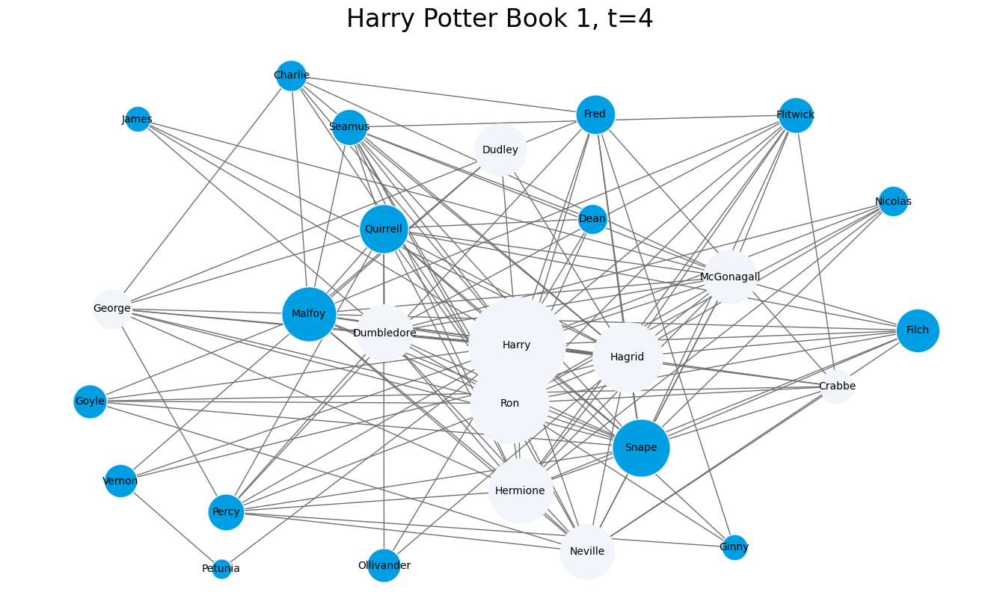

In [22]:
#Simulate: seed Neville, McGonagall at t=-1; Ron at t=0
infection_times1 = {'Neville': -1, 'McGonagall': -1, 'Ron': 0}

for t in range(5):
    plot_cascade(G1, pos1, weighted_degrees1, infection_times1, t,
                 title_prefix='Harry Potter Book 1')
    infection_times1 = independent_cascade(G1, t, infection_times1)

### 3.7 Influence Maximisation

In [24]:
#Build a summary table of node importance by various metrics
top1 = pd.DataFrame.from_dict(dict(nx.degree(G1)), orient='index').sort_values(0, ascending=False)
top1.columns = ['Degree']
top1['Weighted Degree'] = pd.DataFrame.from_dict(dict(nx.degree(G1, weight='value')), orient='index')
top1['PageRank']        = pd.DataFrame.from_dict(dict(nx.pagerank(G1, weight='value')), orient='index')
top1['Betweenness']     = pd.DataFrame.from_dict(dict(nx.betweenness_centrality(G1, weight='value')), orient='index')
top1.head(10)

,Degree,Weighted Degree,PageRank,Betweenness
Harry,26,7532,0.313892,0.009231
Ron,21,3244,0.131233,0.000000
Hagrid,20,2023,0.083130,0.104103
Snape,18,973,0.042862,0.086667
Malfoy,16,785,0.037274,0.126154
Hermione,15,1470,0.059057,0.036923
McGonagall,14,686,0.032562,0.180000
Quirrell,14,504,0.024788,0.216410
Neville,13,747,0.034111,0.007692
Dumbledore,12,877,0.040150,0.007692


/tmp/ipykernel_2122/29496040.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for budget in tqdm.tqdm_notebook(range(max_budget1)):


  0%|          | 0/27 [00:00<?, ?it/s]

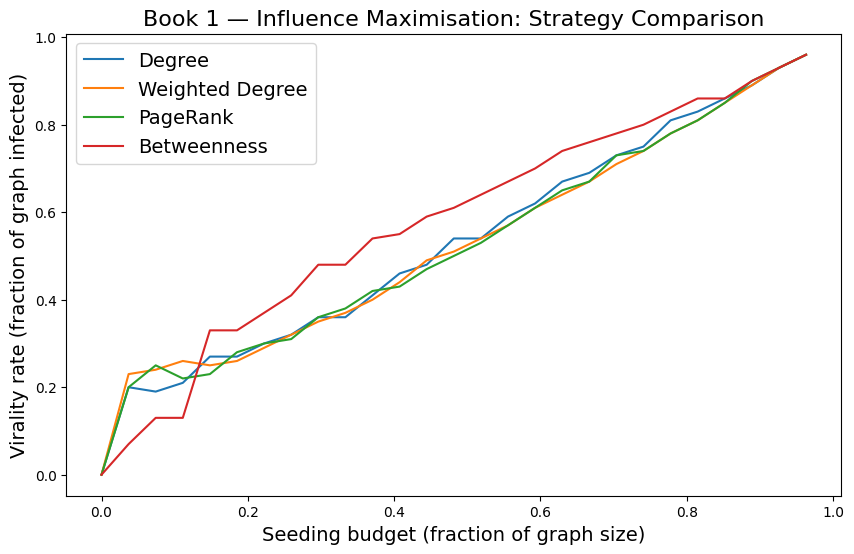

In [25]:
#Compare seeding strategies across all budgets
methods1 = top1.columns
max_budget1 = len(G1.nodes())
trials1 = 10
all_results1 = []

for budget in tqdm.tqdm_notebook(range(max_budget1)):
    results = {'budget': budget}
    for method in methods1:
        infections = []
        for _ in range(trials1):
            infected, t = 0, 0
            inf_times = {n: 0 for n in top1.sort_values(method, ascending=False).index[:budget]}
            while len(inf_times) > infected:
                infected = len(inf_times)
                inf_times = independent_cascade(G1, t, inf_times)
                t += 1
            infections.append(infected)
        results[method] = np.round(np.mean(infections) / len(G1.nodes()), 2)
    all_results1.append(results)

res_df1 = pd.concat([pd.DataFrame.from_dict(r, orient='index').T
                     for r in all_results1]).set_index('budget')
res_df1.index = res_df1.index / len(G1.nodes())

res_df1.plot(figsize=(10, 6))
plt.legend(fontsize=14)
plt.ylabel('Virality rate (fraction of graph infected)', fontsize=14)
plt.xlabel('Seeding budget (fraction of graph size)', fontsize=14)
plt.title('Book 1 — Influence Maximisation: Strategy Comparison', fontsize=16)
plt.show()

In [26]:
#Brute-force best seed pair (budget = 3)
budget1 = 3
seed_sets1 = list(product(*[G1.nodes()] * budget1))
print(f'{len(seed_sets1):,} seeding combinations for budget={budget1}')

trials_bf1 = 50
results_bf1 = {'budget': budget1}

for seed in tqdm.tqdm_notebook(seed_sets1):
    infections = []
    for _ in range(trials_bf1):
        infected, t = 0, 0
        inf_times = {n: 0 for n in seed}
        while len(inf_times) > infected:
            infected = len(inf_times)
            inf_times = independent_cascade(G1, t, inf_times)
            t += 1
        infections.append(infected)
    results_bf1[seed] = np.round(np.mean(infections) / len(G1.nodes()), 2)

top10_seeds1 = sorted(results_bf1.items(), key=lambda x: x[1], reverse=True)[:10]
print('\nTop 10 seed sets (Book 1):')
for seeds, score in top10_seeds1:
    print(f'  {seeds}  →  virality {score:.2f}')

19,683 seeding combinations for budget=3


/tmp/ipykernel_2122/410215745.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for seed in tqdm.tqdm_notebook(seed_sets1):


  0%|          | 0/19683 [00:00<?, ?it/s]


Top 10 seed sets (Book 1):
  budget  →  virality 3.00
  ('Harry', 'Ollivander', 'Seamus')  →  virality 0.32
  ('Harry', 'George', 'Petunia')  →  virality 0.32
  ('Neville', 'Ron', 'Dean')  →  virality 0.32
  ('Ron', 'James', 'Petunia')  →  virality 0.32
  ('Ron', 'Ollivander', 'Ginny')  →  virality 0.32
  ('Ron', 'Fred', 'Nicolas')  →  virality 0.32
  ('Ron', 'George', 'Flitwick')  →  virality 0.32
  ('Harry', 'Petunia', 'Fred')  →  virality 0.31
  ('Harry', 'James', 'Percy')  →  virality 0.31


In [27]:
#Monte-Carlo search for best 2-node seed set
def independent_cascade_mc(graph, seed_nodes):
    """Deterministic IC: every reachable node is always infected (p=1).
    Useful for fast Monte-Carlo influence estimation."""
    active = set(seed_nodes)
    frontier = set(seed_nodes)
    while frontier:
        next_frontier = set()
        for node in frontier:
            next_frontier |= set(graph.neighbors(node)) - active
        active |= next_frontier
        frontier = next_frontier
    return len(active)


def find_max_influence_nodes(graph, num_simulations=1000, seed_size=2):
    max_influence, best_seeds = 0, None
    for _ in range(num_simulations):
        seeds = random.sample(list(graph.nodes()), seed_size)
        influence = independent_cascade_mc(graph, seeds)
        if influence > max_influence:
            max_influence, best_seeds = influence, seeds
    return best_seeds, max_influence


result_nodes1, result_influence1 = find_max_influence_nodes(G1)
print(f'Best seed nodes (Book 1): {result_nodes1}')
print(f'Maximum influence:        {result_influence1} / {len(G1.nodes())} nodes')

Best seed nodes (Book 1): ['Fred', 'Vernon']
Maximum influence:        27 / 27 nodes


---
## 4. Book 7 — Deathly Hallows

The same pipeline is applied to Book 7.  The character-matching function is improved to recognise both first and last names.

### 4.1 Load Book & Filter Character Entities

In [28]:
#Load character list
char_df7 = pd.read_csv('charactersH7.csv')

#Split into first/last name columns for richer matching
char_df7[['first_name', 'last_name']] = (
    char_df7['full_name']
    .loc[char_df7['full_name'].str.split().str.len() == 2]
    .str.split(expand=True)
)
char_df7.head()

,full_name,first_name,last_name
0,Harry Potter,Harry,Potter
1,Hermione Granger,Hermione,Granger
2,Ron Weasley,Ron,Weasley
3,Albus Dumbledore,Albus,Dumbledore
4,Voldemort,NaN,NaN


In [29]:
#Process book with NER
book7_doc = load_book_doc(all_books[1])   # adjust index if needed

#Preview NER on the first 2 000 tokens
displacy.render(book7_doc[0:2000], style='ent', jupyter=True)

In [30]:
def match_entities_book7(entities, character_df):
    """Return full names for any entity matching a first or last name."""
    matched = []
    for entity in entities:
        for _, row in character_df.iterrows():
            if not pd.isna(row.get('first_name')) and row['first_name'] in entity:
                matched.append(row['full_name'])
            elif not pd.isna(row.get('last_name')) and row['last_name'] in entity:
                matched.append(row['full_name'])
    return matched

sent_df7 = build_sent_entity_df(book7_doc)
sent_df7['character_entities'] = sent_df7['entities'].apply(
    lambda x: match_entities_book7(x, char_df7))

sent_df7_filtered = sent_df7[sent_df7['character_entities'].map(len) > 0].copy()
sent_df7_filtered.head()

,sentence,entities,character_entities
3,"(âThe, best, ,, â, replied, Severus, Snape...",[Severus Snape],[Severus Snape]
10,"(Harry, Potter, and, the, Deathly, Hallows, -,...","[Harry Potter, Snape]","[Harry Potter, James Potter, Lily Potter, Seve..."
18,"(âHe, always, did, himself, well, ,, Lucius, .)","[âHe, Lucius]",[Lucius Malfoy]
22,"(Gravel, crackled, beneath, their, feet, as, S...","[Snape, Yaxley]",[Severus Snape]
24,"(The, eyes, of, the, pale, -, faced, portraits...","[Snape, Yaxley]",[Severus Snape]


### 4.2 Build Relationship Graph

In [32]:
rel_df7 = build_relationship_df(sent_df7_filtered)
G7 = build_graph(rel_df7)

weighted_degrees7 = dict(nx.degree(G7, weight='value'))
print(f"Nodes: {G7.number_of_nodes()}, Edges: {G7.number_of_edges()}")
rel_df7.head()

Nodes: 49, Edges: 419


,source,target,value
0,Harry Potter,James Potter,6241
1,James Potter,Lily Potter,6219
2,Lily Potter,Severus Snape,331
3,Lucius Malfoy,Severus Snape,8
4,Harry Potter,Severus Snape,690


### 4.3 Visualisation

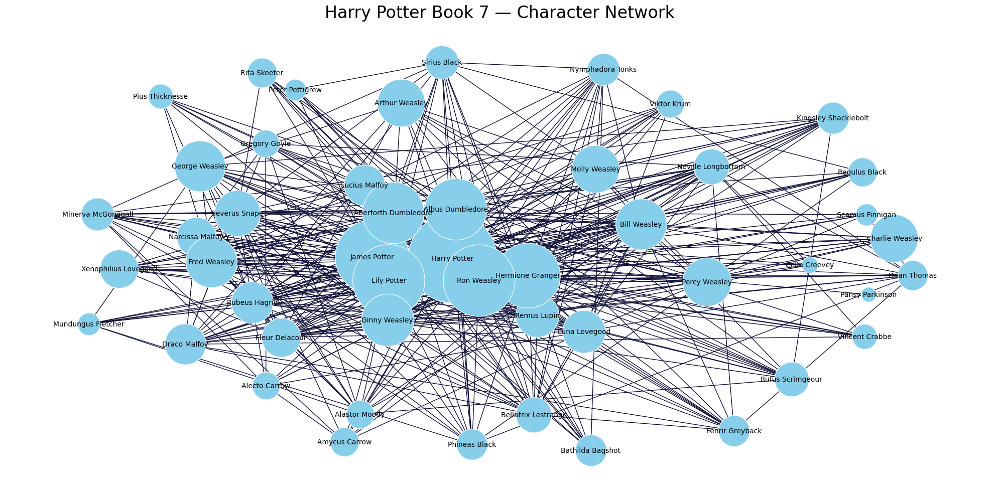

In [34]:
#Static plot
pos7 = nx.spring_layout(G7, weight='value', iterations=20, k=4, seed=42)

plt.figure(figsize=(20, 10))
plt.axis('off')
plt.title('Harry Potter Book 7 — Character Network', fontsize=24)

for node in G7.nodes():
    size = 100 * weighted_degrees7[node] ** 0.5
    ns = nx.draw_networkx_nodes(G7, pos7, nodelist=[node],
                                node_size=size, node_color='skyblue')
    ns.set_edgecolor('#f2f6fa')

nx.draw_networkx_labels(G7, pos7,
    {n: n.replace('-', '\n') for n in G7.nodes()}, font_size=10)

for e in G7.edges(data=True):
    nx.draw_networkx_edges(G7, pos7, [e], edge_color='#0f0f37')

plt.tight_layout()
plt.show()

#Interactive network
net7 = Network(width='1000px', height='700px',
               bgcolor='#222222', font_color='white', cdn_resources='in_line')
nx.set_node_attributes(G7, dict(G7.degree), 'size')
net7.from_nx(G7)
net7.repulsion()
net7.save_graph('Harry_Potter_Book7.html')

with open('Harry_Potter_Book7.html', 'r') as f:
    html = f.read()

display(HTML(html))

### 4.4 Centrality Analysis

In [35]:
deg_cent7   = nx.degree_centrality(G7)
clo_cent7   = nx.closeness_centrality(G7)
bet_cent7   = nx.betweenness_centrality(G7)

print('Highest Degree Centrality:     ', max(zip(deg_cent7.values(), deg_cent7.keys())))
print('Highest Closeness Centrality:  ', max(zip(clo_cent7.values(), clo_cent7.keys())))
print('Highest Betweenness Centrality:', max(zip(bet_cent7.values(), bet_cent7.keys())))

print(f'Average Shortest Path Length:  {nx.average_shortest_path_length(G7):.4f}')

Highest Degree Centrality:      (1.0, 'Harry Potter')
Highest Closeness Centrality:   (1.0, 'Harry Potter')
Highest Betweenness Centrality: (0.17268988399307544, 'Harry Potter')
Average Shortest Path Length:  1.6437


### 4.5 Community Detection (Louvain)

In [36]:
partition7 = community_louvain.best_partition(G7)

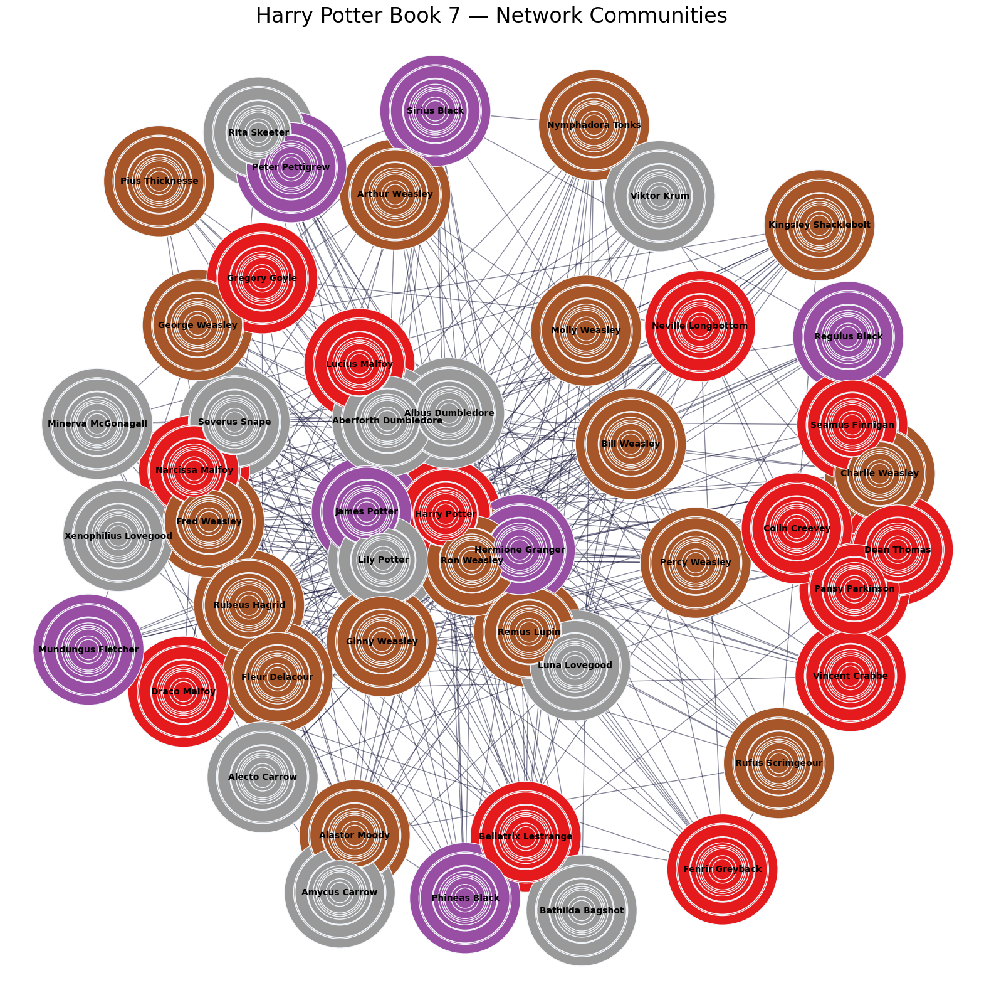

In [38]:
partition7 = community_louvain.best_partition(G7)

#Static community plot
pos7_comm = nx.spring_layout(G7, weight='value', iterations=20, k=4, seed=42)
plt.figure(figsize=(20, 20))

for node in G7.nodes():
    size = 100 * weighted_degrees7[node] ** 0.5
    ns = nx.draw_networkx_nodes(G7, pos7_comm, node_size=size,
                                node_color=list(partition7.values()),
                                cmap=plt.cm.Set1)
    ns.set_edgecolor('#f2f6fa')

for e in G7.edges(data=True):
    nx.draw_networkx_edges(G7, pos7_comm, [e], edge_color='#0f0f37', alpha=0.5)

nx.draw_networkx_labels(G7, pos7_comm,
    {n: n.replace('-', '\n') for n in G7.nodes()},
    font_size=10, font_weight='bold')

plt.axis('off')
plt.title('Harry Potter Book 7 — Network Communities', fontsize=24)
plt.show()

#Interactive community network
nx.set_node_attributes(G7, partition7, 'group')
com_net7 = Network(width='1000px', height='700px',
                   bgcolor='#222222', font_color='white', cdn_resources='in_line')
com_net7.from_nx(G7)
com_net7.repulsion()
com_net7.save_graph('harry_potter_book7_communities.html')

with open('harry_potter_book7_communities.html', 'r') as f:
    html = f.read()

display(HTML(html))

### 4.6 Information Spread — Independent Cascade Model

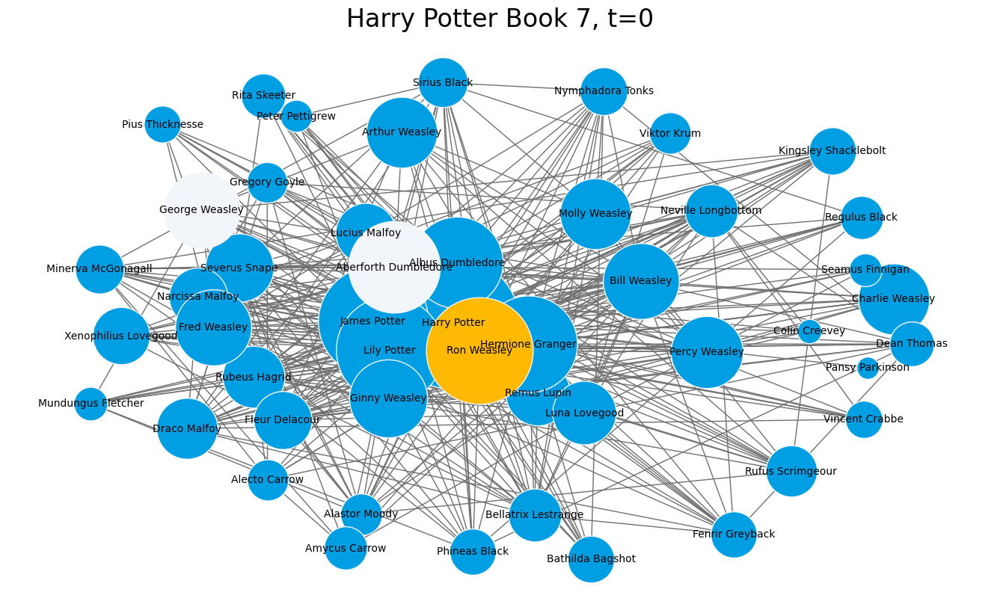

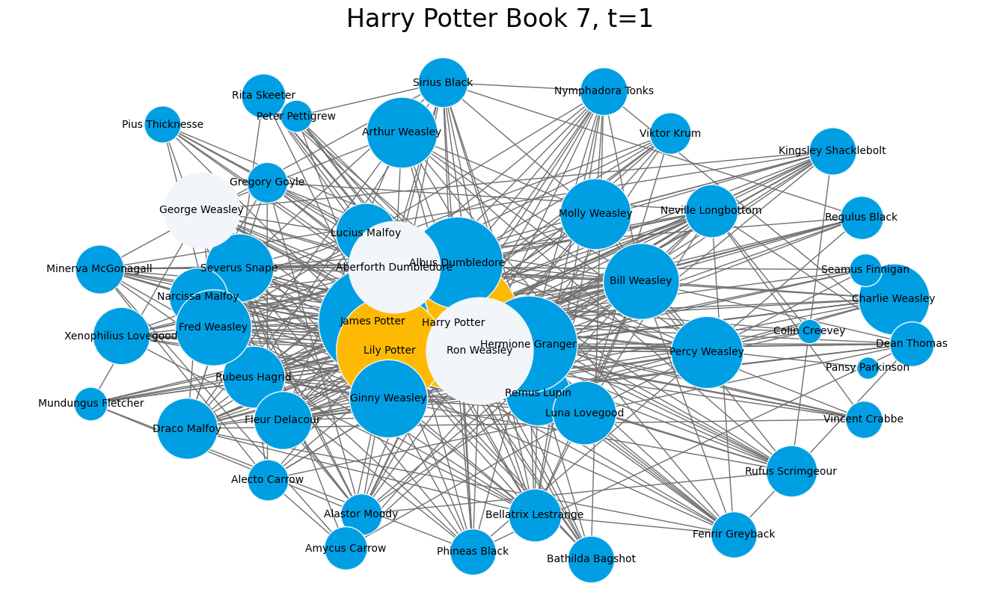

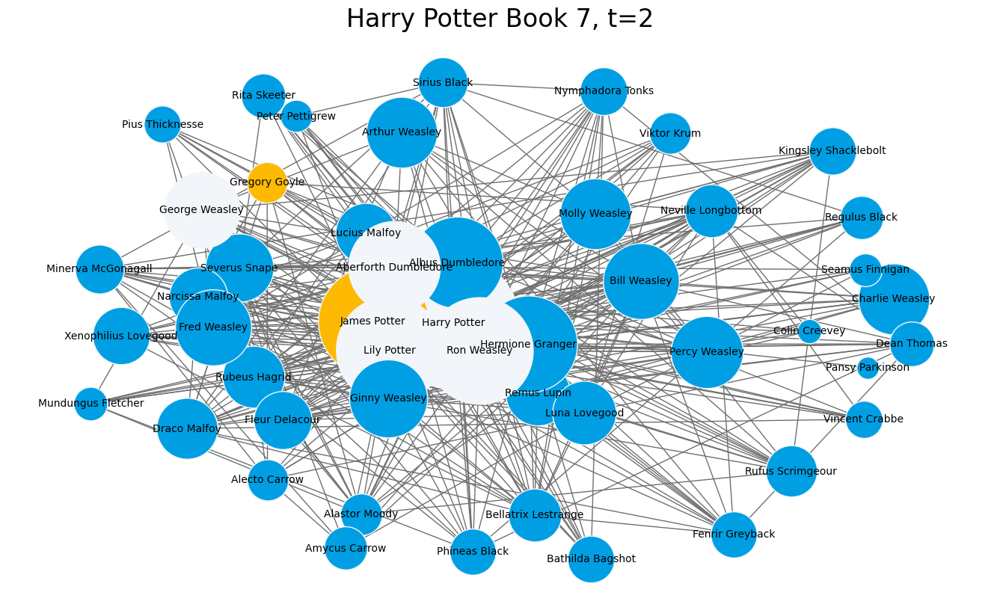

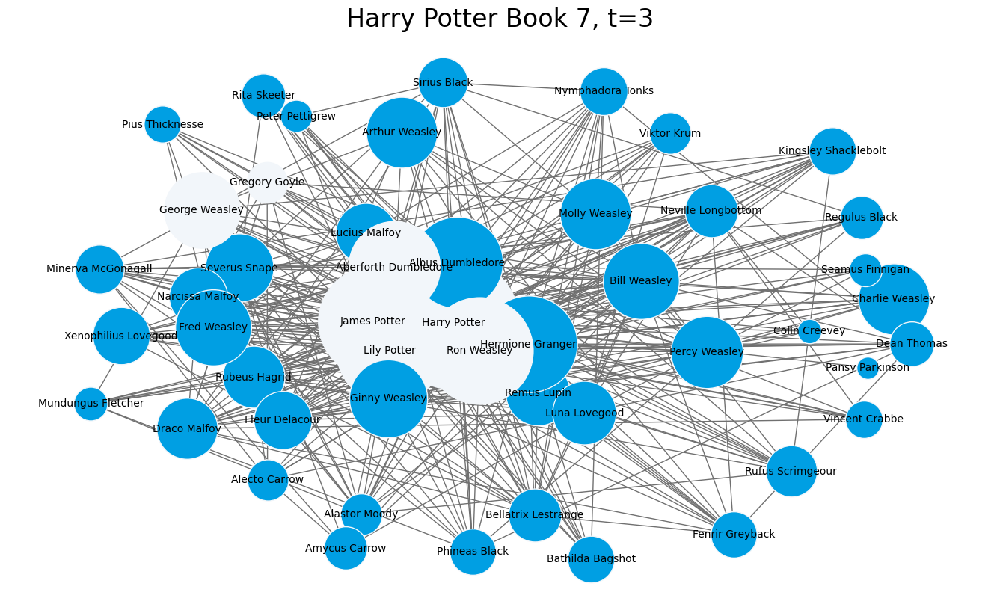

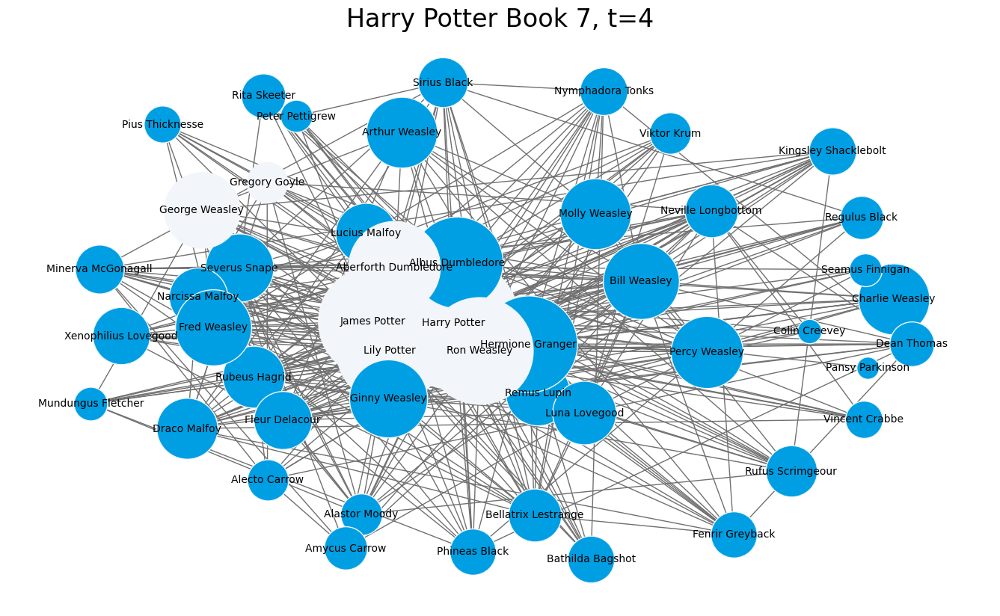

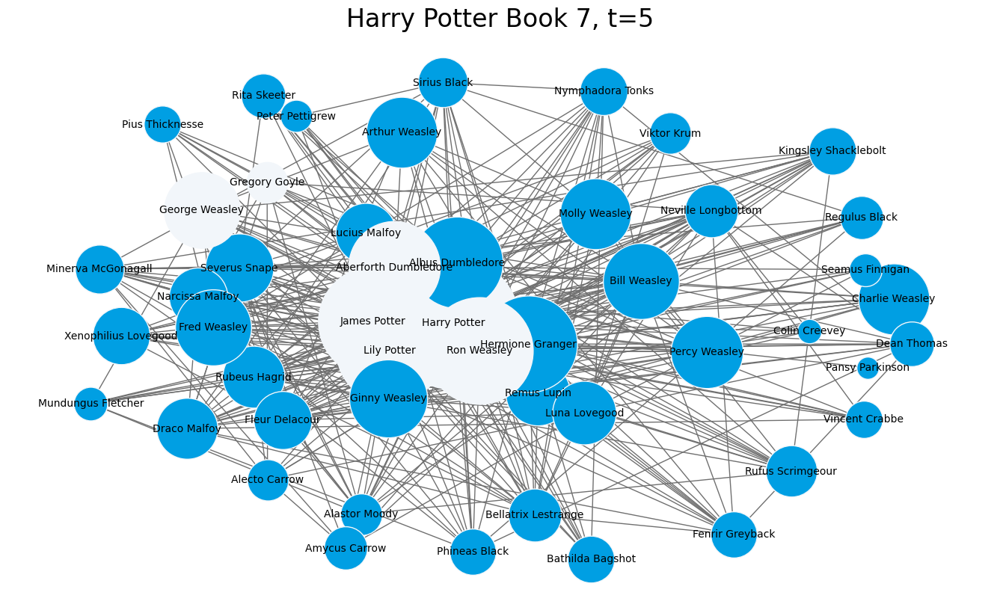

In [39]:
#Simulate: seed Aberforth Dumbledore, George Weasley at t=-1; Ron Weasley at t=0
infection_times7 = {'Aberforth Dumbledore': -1, 'George Weasley': -1, 'Ron Weasley': 0}

for t in range(6):
    plot_cascade(G7, pos7, weighted_degrees7, infection_times7, t,
                 title_prefix='Harry Potter Book 7')
    infection_times7 = independent_cascade(G7, t, infection_times7)

### 4.7 Influence Maximisation

In [40]:
#Summary table of node importance metrics
top7 = pd.DataFrame.from_dict(dict(nx.degree(G7)), orient='index').sort_values(0, ascending=False)
top7.columns = ['Degree']
top7['Weighted Degree'] = pd.DataFrame.from_dict(dict(nx.degree(G7, weight='value')), orient='index')
top7['Betweenness']     = pd.DataFrame.from_dict(dict(nx.betweenness_centrality(G7, weight='value')), orient='index')
top7.head(10)

,Degree,Weighted Degree,Betweenness
Harry Potter,48,26302,0.041667
Ron Weasley,45,11166,0.053635
Hermione Granger,42,7498,0.060461
Lily Potter,40,11350,0.013741
Aberforth Dumbledore,30,6040,0.126921
Bill Weasley,29,2864,0.036052
Rubeus Hagrid,28,1266,0.181531
Albus Dumbledore,26,6036,0.057713
Severus Snape,26,1856,0.041814
Remus Lupin,25,1483,0.031649


/tmp/ipykernel_2122/2468986974.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for budget in tqdm.tqdm_notebook(range(max_budget7)):


  0%|          | 0/49 [00:00<?, ?it/s]

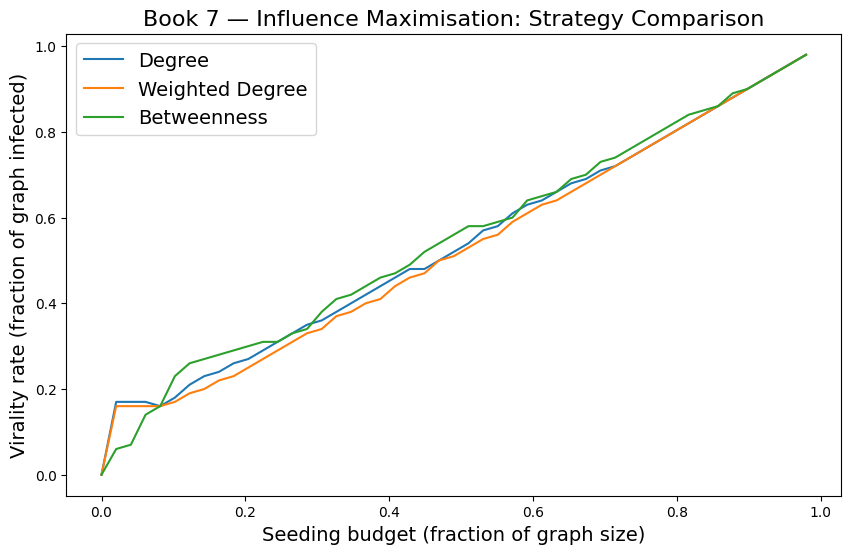

In [41]:
#Compare seeding strategies across all budgets (Book 7)
methods7 = top7.columns
max_budget7 = len(G7.nodes())
trials7 = 50
all_results7 = []

for budget in tqdm.tqdm_notebook(range(max_budget7)):
    results = {'budget': budget}
    for method in methods7:
        infections = []
        for _ in range(trials7):
            infected, t = 0, 0
            inf_times = {n: 0 for n in top7.sort_values(method, ascending=False).index[:budget]}
            while len(inf_times) > infected:
                infected = len(inf_times)
                inf_times = independent_cascade(G7, t, inf_times)
                t += 1
            infections.append(infected)
        results[method] = np.round(np.mean(infections) / len(G7.nodes()), 2)
    all_results7.append(results)

res_df7 = pd.concat([pd.DataFrame.from_dict(r, orient='index').T
                     for r in all_results7]).set_index('budget')
res_df7.index = res_df7.index / len(G7.nodes())

res_df7.plot(figsize=(10, 6))
plt.legend(fontsize=14)
plt.ylabel('Virality rate (fraction of graph infected)', fontsize=14)
plt.xlabel('Seeding budget (fraction of graph size)', fontsize=14)
plt.title('Book 7 — Influence Maximisation: Strategy Comparison', fontsize=16)
plt.show()

In [42]:
#Brute-force best seed pair (budget = 2; book 7 graph is larger so keep budget small)
budget7 = 2
seed_sets7 = list(product(*[G7.nodes()] * budget7))
print(f'{len(seed_sets7):,} seeding combinations for budget={budget7}')

trials_bf7 = 20
results_bf7 = {'budget': budget7}

for seed in tqdm.tqdm_notebook(seed_sets7):
    infections = []
    for _ in range(trials_bf7):
        infected, t = 0, 0
        inf_times = {n: 0 for n in seed}
        while len(inf_times) > infected:
            infected = len(inf_times)
            inf_times = independent_cascade(G7, t, inf_times)
            t += 1
        infections.append(infected)
    results_bf7[seed] = np.round(np.mean(infections) / len(G7.nodes()), 2)

top10_seeds7 = sorted(results_bf7.items(), key=lambda x: x[1], reverse=True)[:10]
print('\nTop 10 seed sets (Book 7):')
for seeds, score in top10_seeds7:
    print(f'  {seeds}  →  virality {score:.2f}')

2,401 seeding combinations for budget=2


/tmp/ipykernel_2122/3000263779.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for seed in tqdm.tqdm_notebook(seed_sets7):


  0%|          | 0/2401 [00:00<?, ?it/s]


Top 10 seed sets (Book 7):
  budget  →  virality 2.00
  ('Ginny Weasley', 'James Potter')  →  virality 0.21
  ('Harry Potter', 'Seamus Finnigan')  →  virality 0.20
  ('Lily Potter', 'Bellatrix Lestrange')  →  virality 0.20
  ('Lily Potter', 'Percy Weasley')  →  virality 0.20
  ('Lily Potter', 'Charlie Weasley')  →  virality 0.20
  ('Aberforth Dumbledore', 'James Potter')  →  virality 0.20
  ('Fred Weasley', 'Ron Weasley')  →  virality 0.20
  ('Harry Potter', 'Narcissa Malfoy')  →  virality 0.19
  ('Harry Potter', 'Ginny Weasley')  →  virality 0.19


In [43]:
result_nodes7, result_influence7 = find_max_influence_nodes(G7)
print(f'Best seed nodes (Book 7): {result_nodes7}')
print(f'Maximum influence:        {result_influence7} / {len(G7.nodes())} nodes')

Best seed nodes (Book 7): ['Bill Weasley', 'Albus Dumbledore']
Maximum influence:        49 / 49 nodes
